# Clusterização - Matemática Computacional

## 2. Importando as bibliotecas e as funções

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans
from sklearn import metrics

sns.set_theme(style="ticks")

### Criando versão nativa do Mini Batch K-Means

#### Algoritmo do Mini-Batch K-Means

1. **Entrada**: $X \in \Re^{d,N}$, número de clusters K, tamanho do batch M, número máximo de iterações T.

2. Inicialize os centróides $w_1, w_2, ..., w_k \in \Re^d$ aleatoriamente.

4. **for i=1 to T do**:

    1. $X_m \leftarrow$ aleatoriamente pega M amostras de X.
    
    5. **for $x \in X_m$ do**
    
        $d[x] \leftarrow J(K,x)$ $ \qquad \triangleright$ encontra o centroide do mais proximo de x
    
    6. **end for**

    7. **for $x \in X_m$ do**

        $k \leftarrow d[x]$

        $n_{k^*} \leftarrow n_k + 1$

        $\gamma \leftarrow \frac{1}{n_{k^*}}$

        $w_{k^*} \leftarrow w_{k} + \gamma ( x_i - w_k )$

    8. **end for** 

9. **end for**

8. **Saída**: Os centróides finais dos clusters após a convergência.

In [6]:
class MiniBatchKMeansNative:
    def __init__(self, n_clusters=8, max_iter=100, batch_size=100, learning_rate=0.01):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.batch_size = batch_size
        self.learning_rate = learning_rate

    def initialize_centroids(self, X):
        indices = np.random.choice(X.shape[0], size=self.n_clusters, replace=False)
        clusterCounts = np.zeros(self.n_clusters, dtype=int)
        return X[indices], clusterCounts

    def find_closest_centroids(self, X, centroids):
        distances = np.sqrt(((X - centroids[:, np.newaxis]) ** 2).sum(axis=2))
        return np.argmin(distances, axis=0)

    def update_centroids(self, XM,XM_indices,d,centroids,clusterCounts):
        """ print("XM",XM)
        print("XM_indices",XM_indices)
        print("d",d)
        print("centroids",centroids)
        print("clusterCounts",clusterCounts) """
        """ clusterCounts += np.bincount(d, minlength=len(clusterCounts))
        learningRate = 1 / clusterCounts.astype(float)
        centroids = centroids + learningRate*(XM-d) """
        for i in range(len(XM)):
            clusterCounts[d[i]] += 1
            learningRate = 1/clusterCounts[d[i]]
            centroids[d[i]] = centroids[d[i]] + learningRate*(XM[i]-centroids[d[i]])

    def select_random_samples(self,X):
        indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
        random_samples = X[indices]
        return indices, random_samples

    def fit(self, X):
        centroids, clusterCounts = self.initialize_centroids(X)  
        n_samples = X.shape[0]

        if self.batch_size > n_samples:
            self.batch_size = n_samples          

        for _ in range(self.max_iter):
            """ indices = np.random.choice(n_samples, size=self.batch_size, replace=False)
            X_batch = X[indices]

            labels = self.find_closest_centroids(X_batch, centroids)
            self.update_centroids(X_batch, labels, centroids)

            centroids = centroids + self.learning_rate * (X_batch[:, np.newaxis, :] - centroids[labels]) """
            XM_indices, XM = self.select_random_samples(X)
            d = self.find_closest_centroids(XM,centroids)
            self.update_centroids(XM,XM_indices,d,centroids,clusterCounts)

           
        self.centroids = centroids

    def predict(self, X):
        return self.find_closest_centroids(X, self.centroids)


    
""" # Criar uma matriz de dados de exemplo
X = np.array([[79.408289, 152.834424], [98.046263, 186.910700], [240.578979, 48.473684], [109.687183, 277.945769], [249.626082, 229.753352], [358.131243, 445.470938]])

# Criar uma instância do MiniBatchKMeans e ajustar os dados
kmeans = MiniBatchKMeansNative(n_clusters=2)
kmeans.fit(X)

# Obter os rótulos previstos para os dados
labels = kmeans.predict(X)
print(labels) """

' # Criar uma matriz de dados de exemplo\nX = np.array([[79.408289, 152.834424], [98.046263, 186.910700], [240.578979, 48.473684], [109.687183, 277.945769], [249.626082, 229.753352], [358.131243, 445.470938]])\n\n# Criar uma instância do MiniBatchKMeans e ajustar os dados\nkmeans = MiniBatchKMeansNative(n_clusters=2)\nkmeans.fit(X)\n\n# Obter os rótulos previstos para os dados\nlabels = kmeans.predict(X)\nprint(labels) '

## 3.?. Análise do Mini Batch K-Means do Scikit-Learn

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5359024598964252
Cluster Sklearn: 0.5384759179137074
Cluster nativo 0.5285869003380148
Davies-Bouldin:
Color: 0.7230213812256591
Cluster Sklearn: 0.6846793393097129
Cluster nativo 0.726352386130539
Calinski-Harabasz:
Color: 15233.532707986338
Cluster Sklearn: 15652.975576534323
Cluster nativo 15732.739657194188


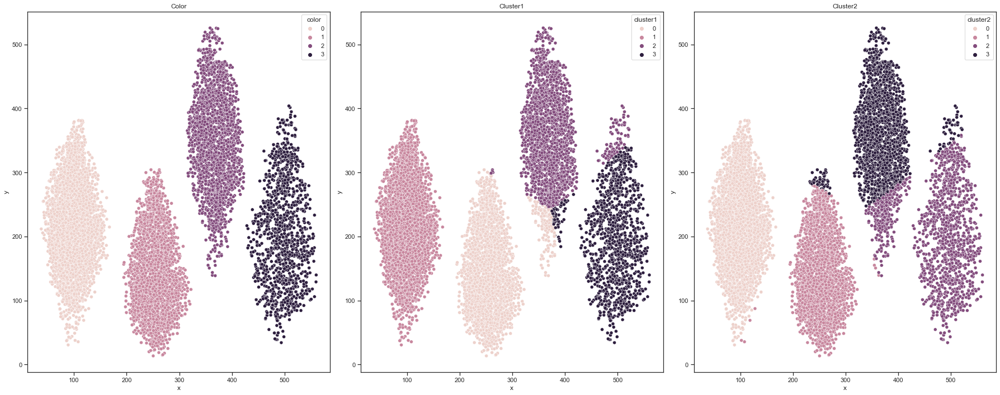

In [7]:
import random

def generate_points(n, x_min, x_max, y_min, y_max):
    points = []
    for _ in range(n):
        x = random.uniform(x_min, x_max)
        y = random.uniform(y_min, y_max)
        point = (x, y)
        points.append(point)
    return points

def plot_clustering(tabela, n):
    df = pd.read_csv(f"./data/exercises/{tabela}.csv")
    clustering1 = MiniBatchKMeans(n_clusters=n, init=generate_points(n, df["x"].min(), df["x"].max(), df["y"].min(), df["x"].max()))
    clustering2 = MiniBatchKMeansNative(n_clusters=n)

    i=0
    for clustering in [clustering1,clustering2]:
        i+=1
        clustering.fit(df[["x", "y"]].to_numpy())
        labels = clustering.predict(df[["x", "y"]].to_numpy())
        df[f'cluster{i}'] = labels

    print("Silhouette:")
    print("Color:", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["color"], metric="euclidean"))
    print("Cluster Sklearn:", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["cluster1"], metric="euclidean"))
    print("Cluster nativo", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["cluster2"], metric="euclidean"))
    print("Davies-Bouldin:")
    print("Color:", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["color"]))
    print("Cluster Sklearn:", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["cluster1"]))
    print("Cluster nativo", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["cluster2"]))
    print("Calinski-Harabasz:")
    print("Color:", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["color"]))
    print("Cluster Sklearn:", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["cluster1"]))
    print("Cluster nativo", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["cluster2"]))

    fig, ax = plt.subplots(1, 3, figsize=(25,10))
    sns.scatterplot(data=df, x='x', y='y', hue='color', ax=ax[0])
    ax[0].set_title('Color')
    sns.scatterplot(data=df, x='x', y='y', hue='cluster1', ax=ax[1])
    ax[1].set_title('Cluster1')
    sns.scatterplot(data=df, x='x', y='y', hue='cluster2', ax=ax[2])
    ax[2].set_title('Cluster2')

    plt.tight_layout()
    plt.show()

### 3.?.1. Clustering Exercises

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5359024598964252
Cluster Sklearn: 0.5249286561961819
Cluster nativo 0.4243527308541957
Davies-Bouldin:
Color: 0.7230213812256591
Cluster Sklearn: 0.7309873440181553
Cluster nativo 0.7660308143304442
Calinski-Harabasz:
Color: 15233.532707986338
Cluster Sklearn: 15630.55986434487
Cluster nativo 10003.131277554085


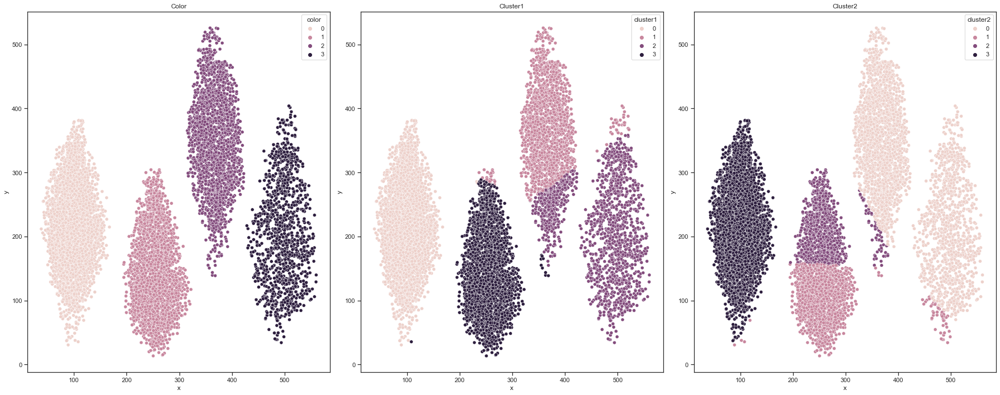

In [8]:
plot_clustering("basic1", 4)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.4670415948654753
Cluster Sklearn: 0.3832746190563169
Cluster nativo 0.464635327298809
Davies-Bouldin:
Color: 0.863005042040745
Cluster Sklearn: 1.0130160428452102
Cluster nativo 0.8703244712025485
Calinski-Harabasz:
Color: 16988.284003171135
Cluster Sklearn: 12475.984282033784
Cluster nativo 16930.709586130615


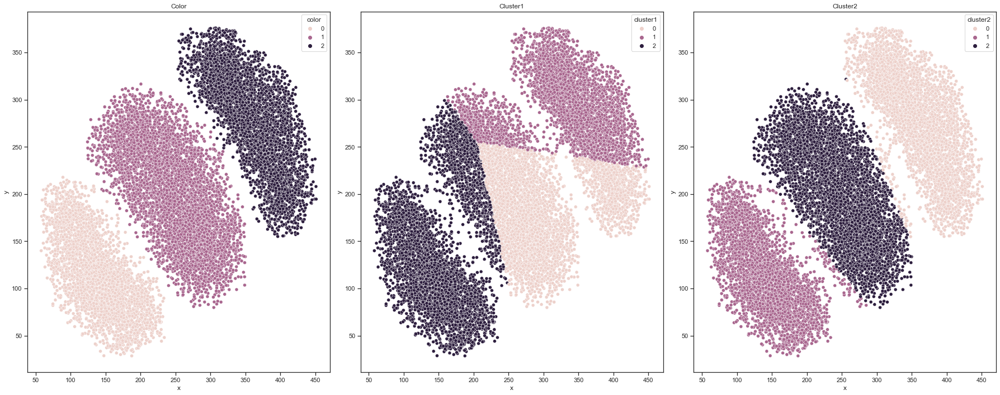

In [9]:
plot_clustering("basic4", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.7086648772316748
Cluster Sklearn: 0.2777761653572551
Cluster nativo 0.7087884928168264
Davies-Bouldin:
Color: 0.4086946803848604
Cluster Sklearn: 1.0074139394526045
Cluster nativo 0.408445458584707
Calinski-Harabasz:
Color: 14881.511905685964
Cluster Sklearn: 1349.0920247187123
Cluster nativo 14887.602092417328


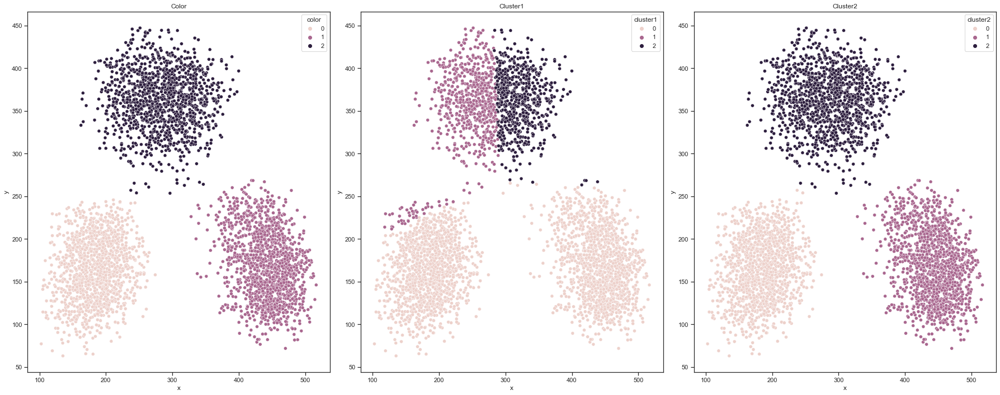

In [10]:
plot_clustering("basic5", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.45470941484633426
Cluster Sklearn: 0.454207397605194
Cluster nativo 0.30345576946003144
Davies-Bouldin:
Color: 0.708673613030343
Cluster Sklearn: 0.7088163108588463
Cluster nativo 1.0890427541264707
Calinski-Harabasz:
Color: 4817.328036051302
Cluster Sklearn: 4756.1496801059675
Cluster nativo 2474.0926819098518


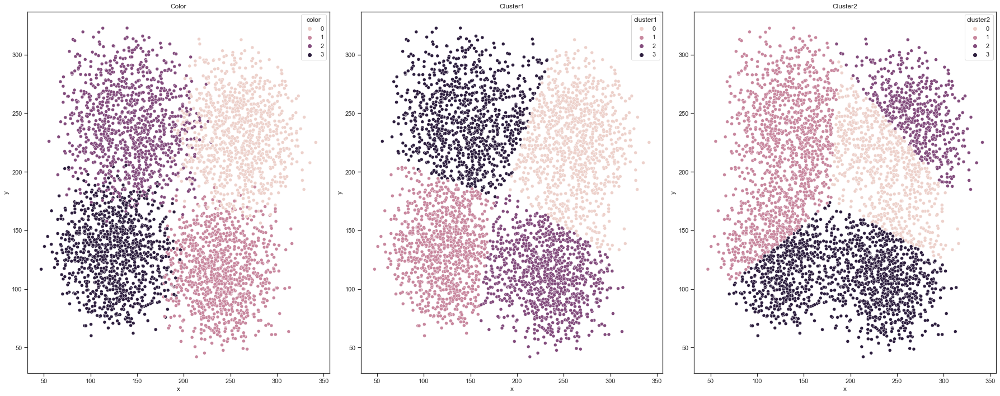

In [11]:
plot_clustering("blob", 4)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.6465156552400856
Cluster Sklearn: 0.5258523508118892
Cluster nativo 0.551027220957894
Davies-Bouldin:
Color: 0.4400533543148168
Cluster Sklearn: 0.6976307376716283
Cluster nativo 0.6576046332819423
Calinski-Harabasz:
Color: 28284.642443328754
Cluster Sklearn: 14014.588283119603
Cluster nativo 16594.680819755224


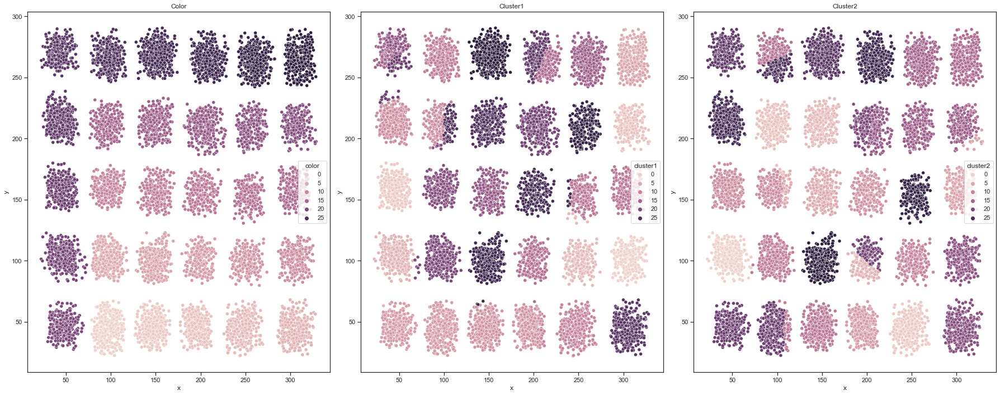

In [12]:
plot_clustering("boxes", 30)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5374000827879934
Cluster Sklearn: 0.4305808704338418
Cluster nativo 0.5416344967218406
Davies-Bouldin:
Color: 0.5940890223863998
Cluster Sklearn: 0.7934813373912682
Cluster nativo 0.5882122421122069
Calinski-Harabasz:
Color: 34966.028200262444
Cluster Sklearn: 24362.814446815526
Cluster nativo 36111.832785046594


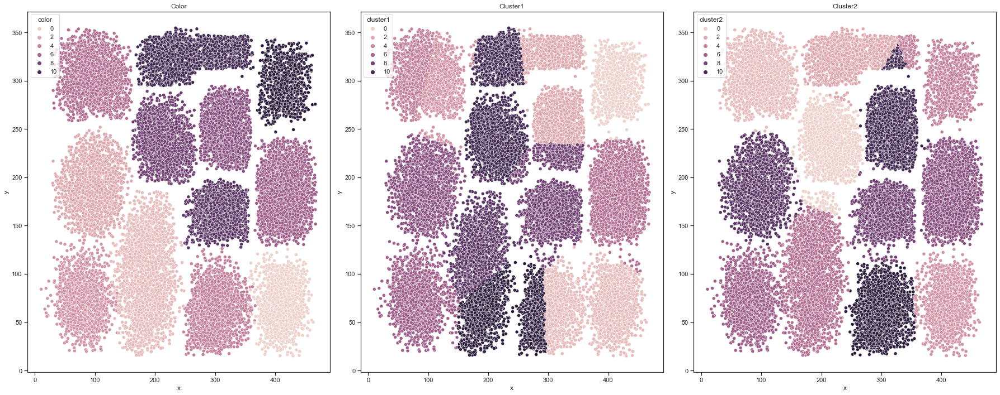

In [13]:
plot_clustering("boxes3", 12)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.7114309961278191
Cluster Sklearn: 0.7126034598377666
Cluster nativo 0.7126034598377666
Davies-Bouldin:
Color: 0.3757538799254382
Cluster Sklearn: 0.3723178116331851
Cluster nativo 0.37231781163318506
Calinski-Harabasz:
Color: 9692.778785946037
Cluster Sklearn: 9787.49794235303
Cluster nativo 9787.49794235303


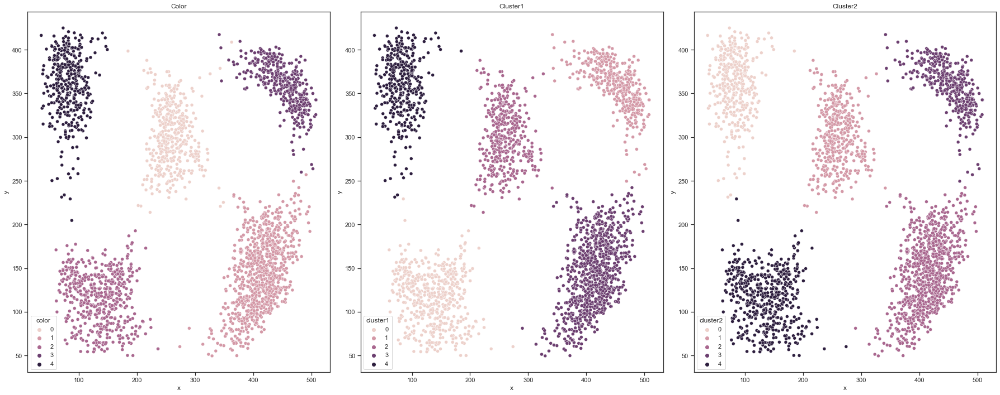

In [14]:
plot_clustering("network", 5)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.6128255623301866
Cluster Sklearn: 0.6089442858907355
Cluster nativo 0.6128255623301866
Davies-Bouldin:
Color: 0.5436091676015101
Cluster Sklearn: 0.5445787563529253
Cluster nativo 0.5436091676015101
Calinski-Harabasz:
Color: 945.686103172692
Cluster Sklearn: 930.5287398568311
Cluster nativo 945.686103172692


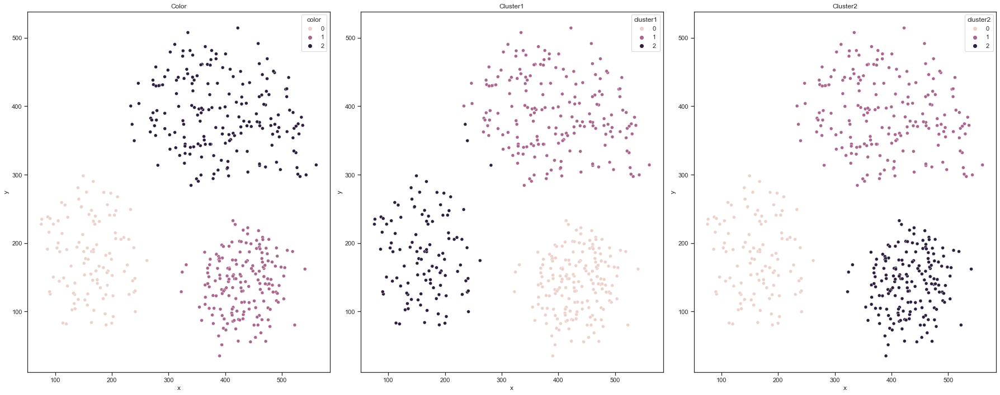

In [15]:
plot_clustering("sparse", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5193736396508104
Cluster Sklearn: 0.5167009534967795
Cluster nativo 0.5187029943906072
Davies-Bouldin:
Color: 0.7315914236355435
Cluster Sklearn: 0.7329198054184262
Cluster nativo 0.7221292454086862
Calinski-Harabasz:
Color: 3122.3724301315324
Cluster Sklearn: 3152.44873731571
Cluster nativo 3275.0665030783666


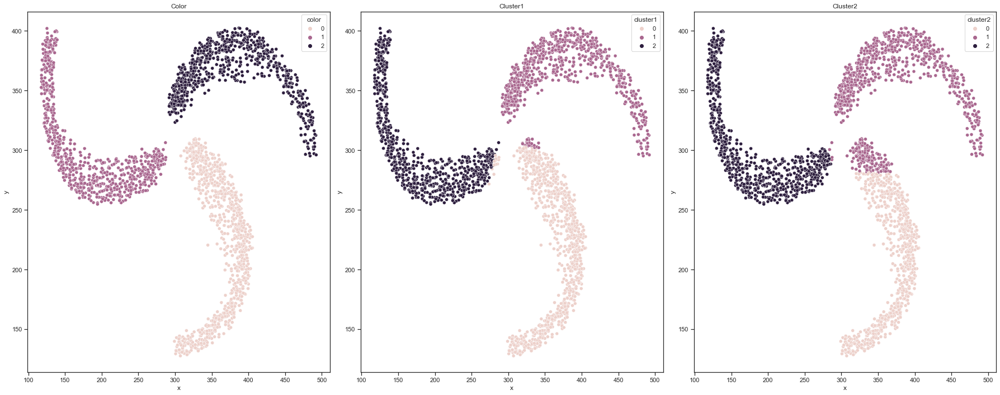

In [16]:
plot_clustering("spirals", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.4445730060107293
Cluster Sklearn: 0.44354476701758344
Cluster nativo 0.4442838780681521
Davies-Bouldin:
Color: 0.776418796483771
Cluster Sklearn: 0.7757897671873114
Cluster nativo 0.7794676185392699
Calinski-Harabasz:
Color: 10581.341427150237
Cluster Sklearn: 10569.827084656341
Cluster nativo 10590.780003741447


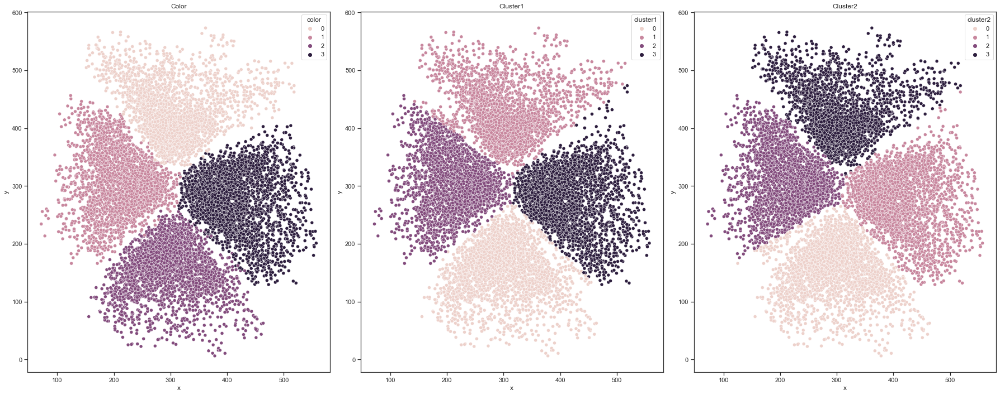

In [17]:
plot_clustering("supernova", 4)